<a href="https://colab.research.google.com/github/visualdatabase/fastdup/blob/main/examples/Duplicate_removal_with_fastdup_the_case_of_high_duplicate_ratio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This notebook teaches how to clean datasets with high ratio of duplicate images with fastdup.

The problem in more detail: nearest neighbor models have trouble finding all copies of the same images since they allow for only top K similar images per image. Thus, sometimes duplicate images land in a few different clusters.

In this notebook we illustrate the problem and propose a couple of solutions.

# Download artwork dataset with many duplicates

In [1]:
!gdown 1vbAQvb--SF-AHNFIVYz8QbNAPw2XdcLi

Downloading...
From: https://drive.google.com/uc?id=1vbAQvb--SF-AHNFIVYz8QbNAPw2XdcLi
To: /content/manga.tar.gz
100% 1.07G/1.07G [00:09<00:00, 110MB/s] 


In [2]:
!tar xf manga.tar.gz

In [4]:
!mkdir manga
!mv 00006 manga
!mv 00007 manga
!mv sample_data manga
!rm -f manga.tar.gz

# install fastdup

In [5]:
!pip install fastdup

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 50.0 MB 1.3 MB/s 


# Build out of the box fastdup connected components

In [7]:
import fastdup
fastdup.run('manga', 'out')

FastDup Software, (C) copyright 2022 Dr. Amir Alush and Dr. Danny Bickson.
On Jupyter notebook running on large datasets, there may be delay getting the console output
A recommended way to fixing this is to run: 
%pip install wurlitzer
%load_ext wurlitzer



0

Failed to read config file ./config.json


100%|██████████| 10/10 [00:04<00:00,  2.08it/s]


Finished OK. Components are stored as image files ./components_[index].jpg
Stored components visual view in  ./components.html


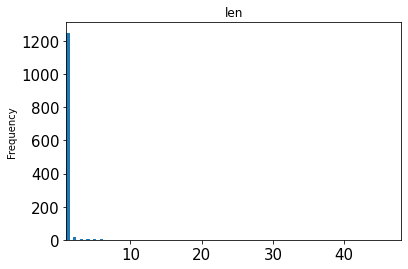

In [19]:
ret = fastdup.create_components_gallery('out','.', max_width=200, num_images=10)


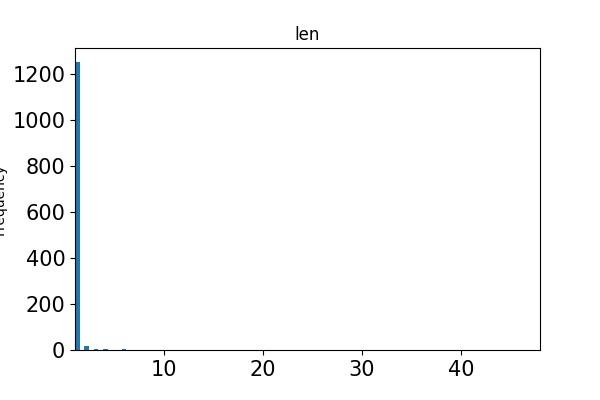
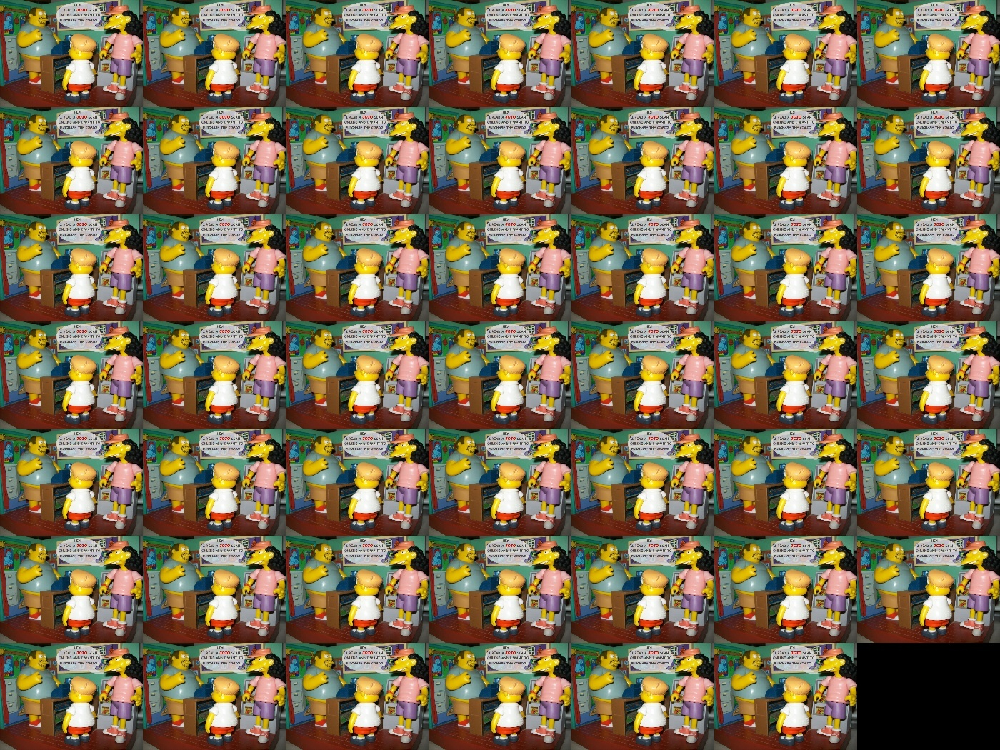
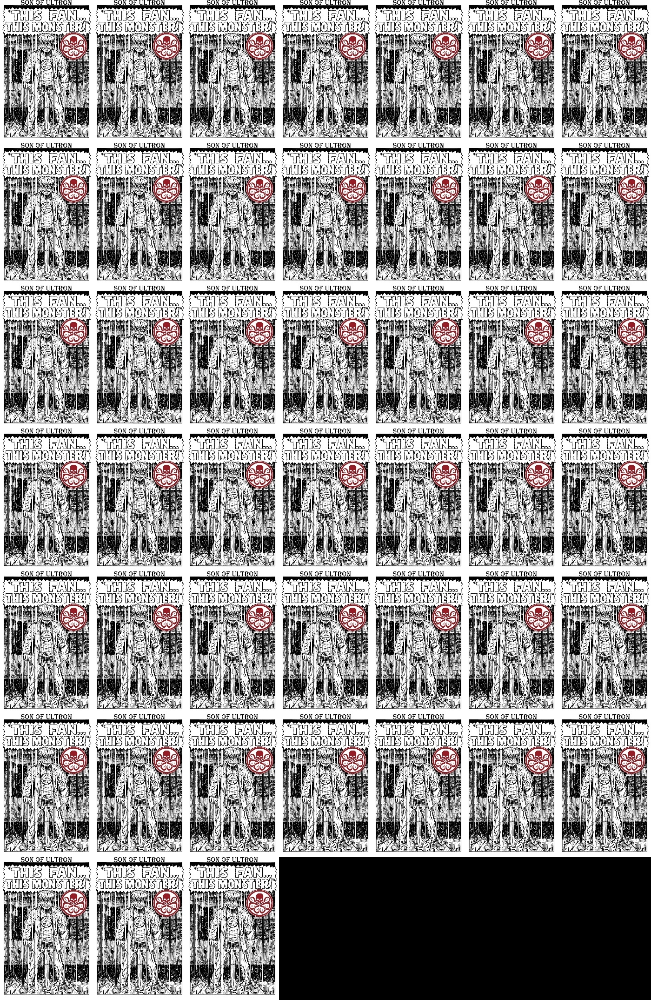
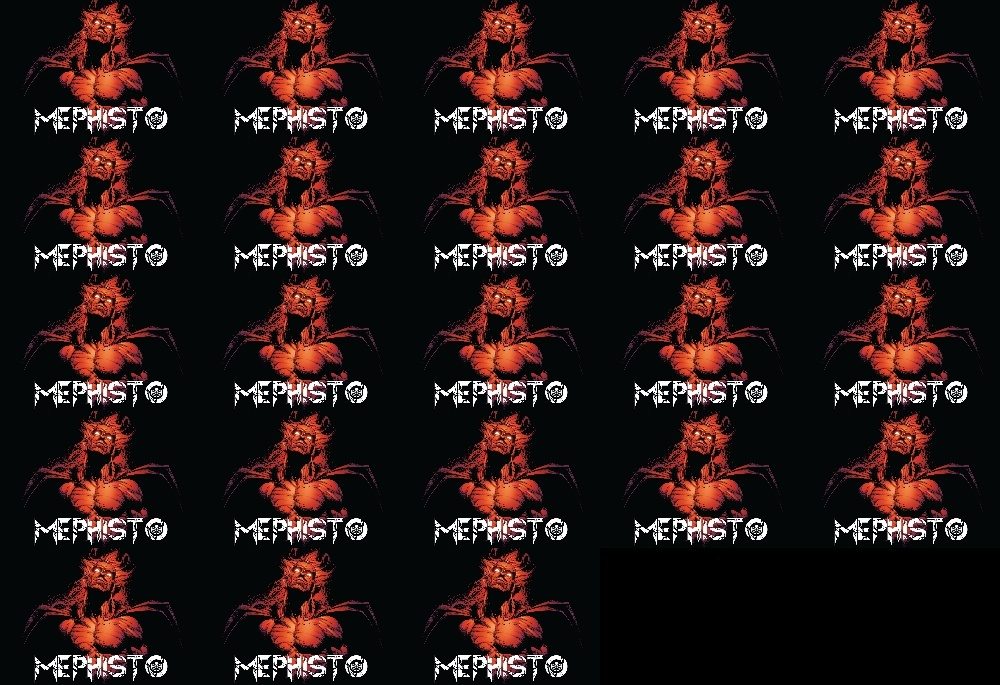
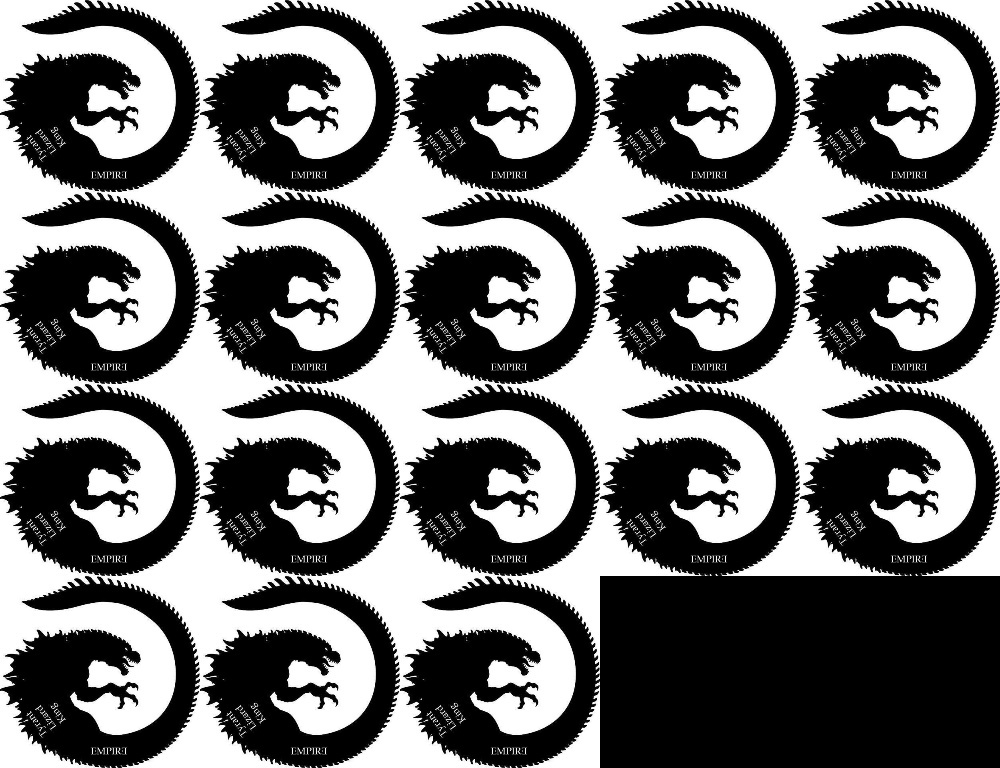
...
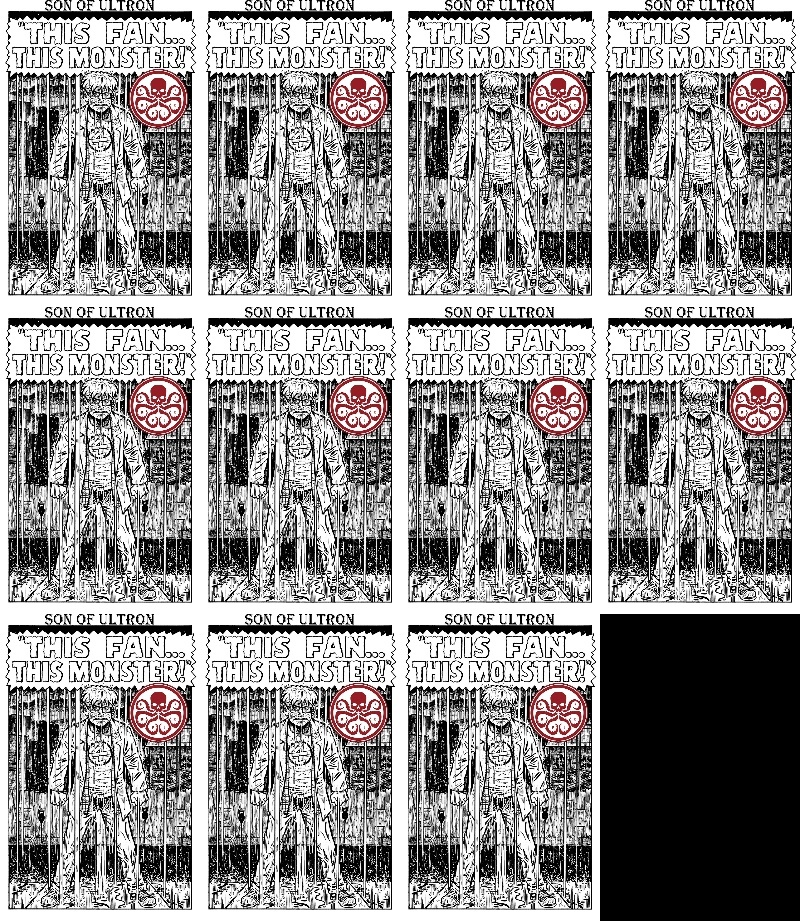
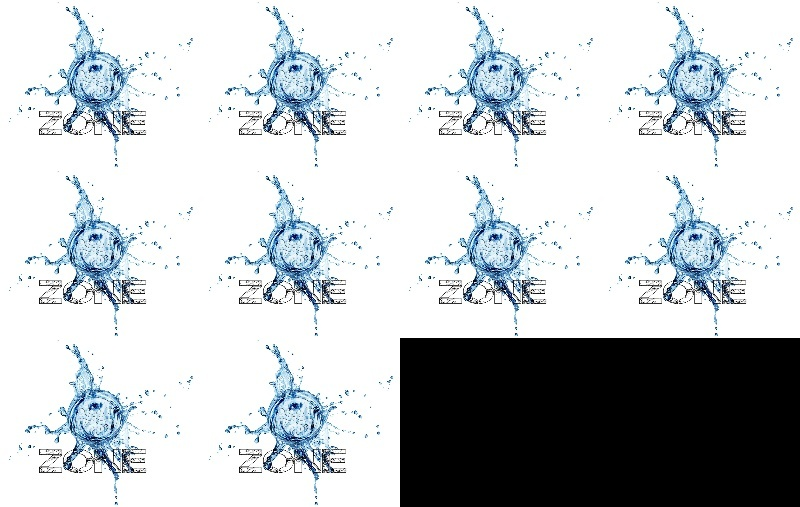
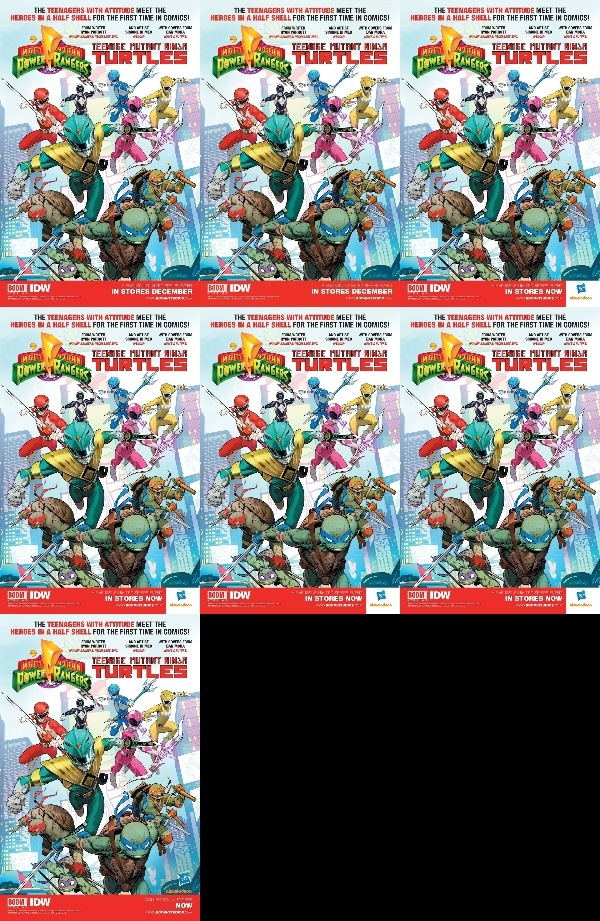
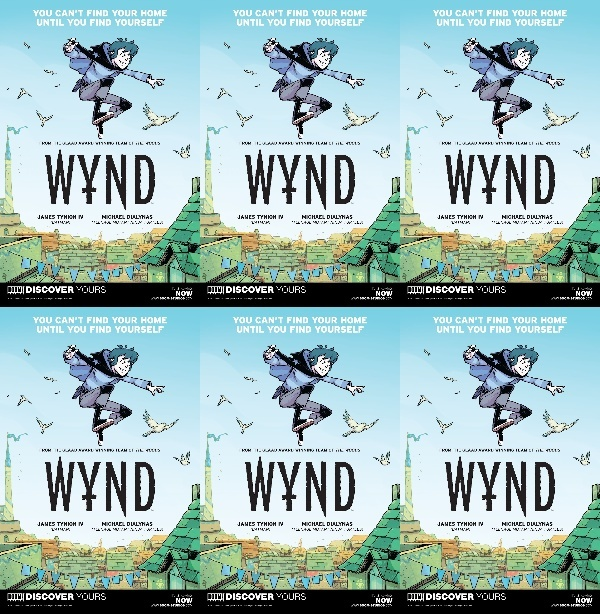
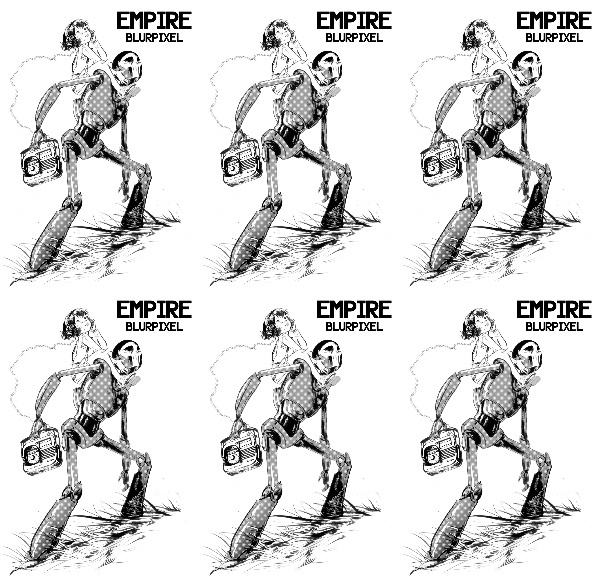

In [20]:
from IPython.display import HTML
HTML(filename='components.html')

# Note that components 44 and 663 should have been merged. But since we are running with k=3 by chance not enough links cross across those two clusters.

## Solution method 1: increase K, more links are added between clusters, this probabilistically there will be fewer identical clusters. The downside for large dataset that may increase runtime.

In [26]:
# Solution method 1: increase K
!rm -fr out2
fastdup.run('manga', 'out2', nearest_neighbors_k=15)

FastDup Software, (C) copyright 2022 Dr. Amir Alush and Dr. Danny Bickson.
On Jupyter notebook running on large datasets, there may be delay getting the console output
A recommended way to fixing this is to run: 
%pip install wurlitzer
%load_ext wurlitzer



0

Failed to read config file ./config.json


100%|██████████| 10/10 [00:05<00:00,  1.82it/s]


Finished OK. Components are stored as image files out2/components_[index].jpg
Stored components visual view in  out2/components.html



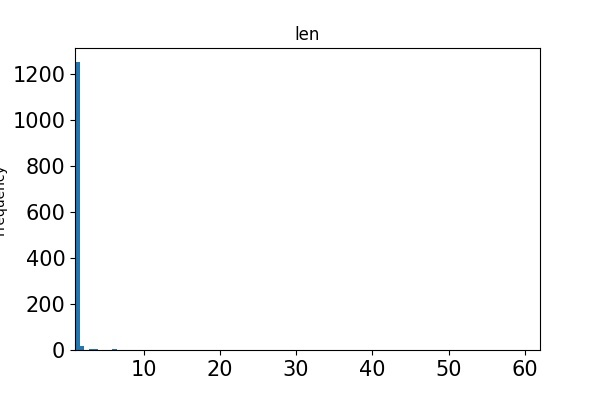
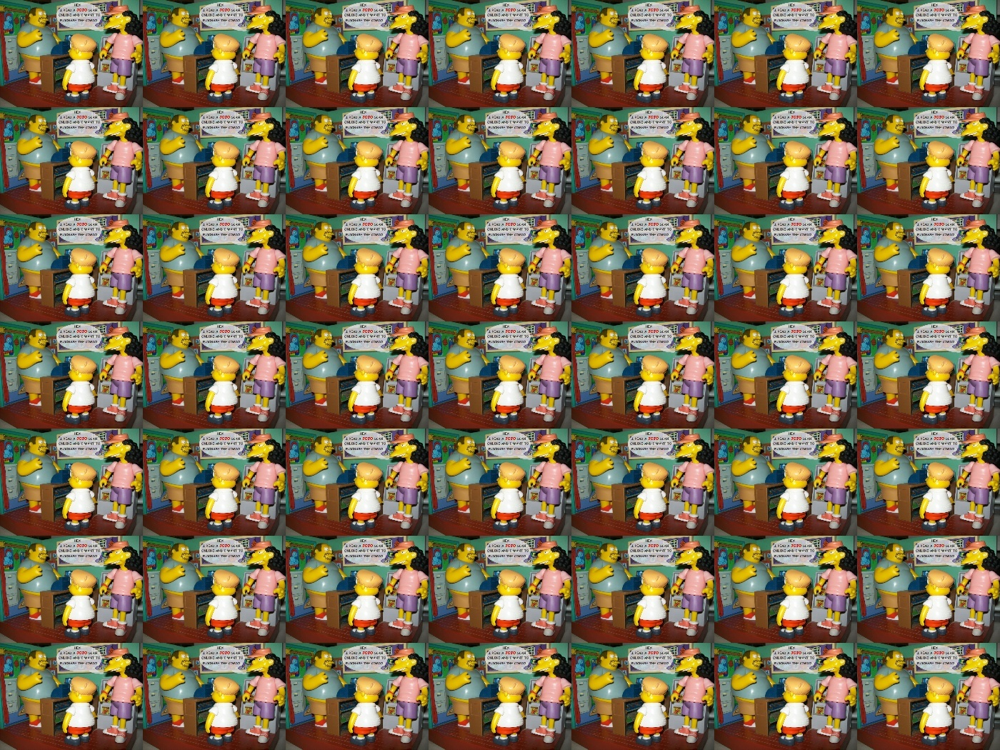
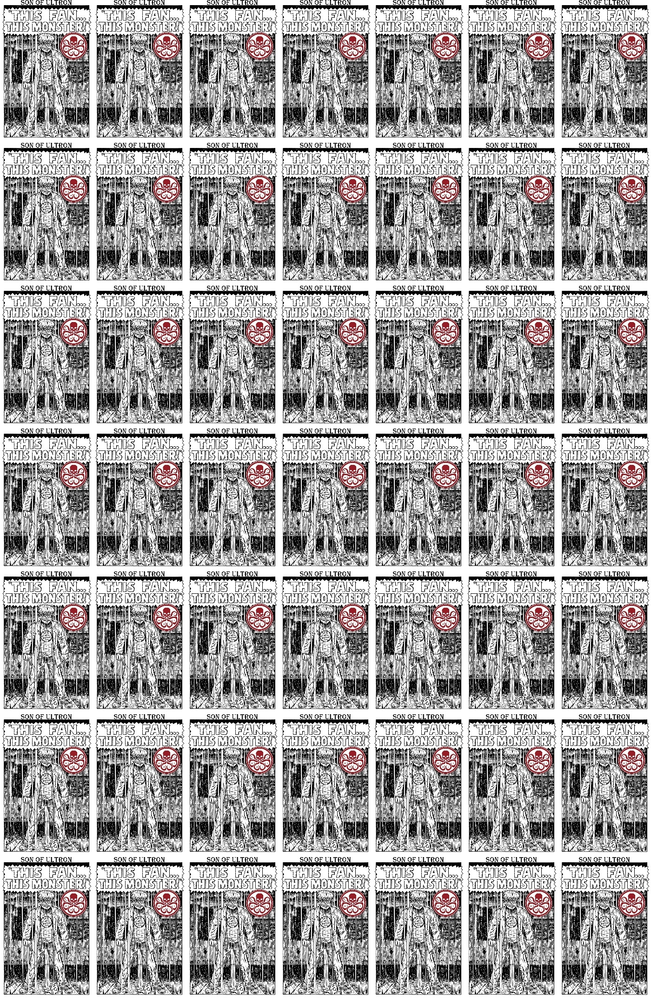
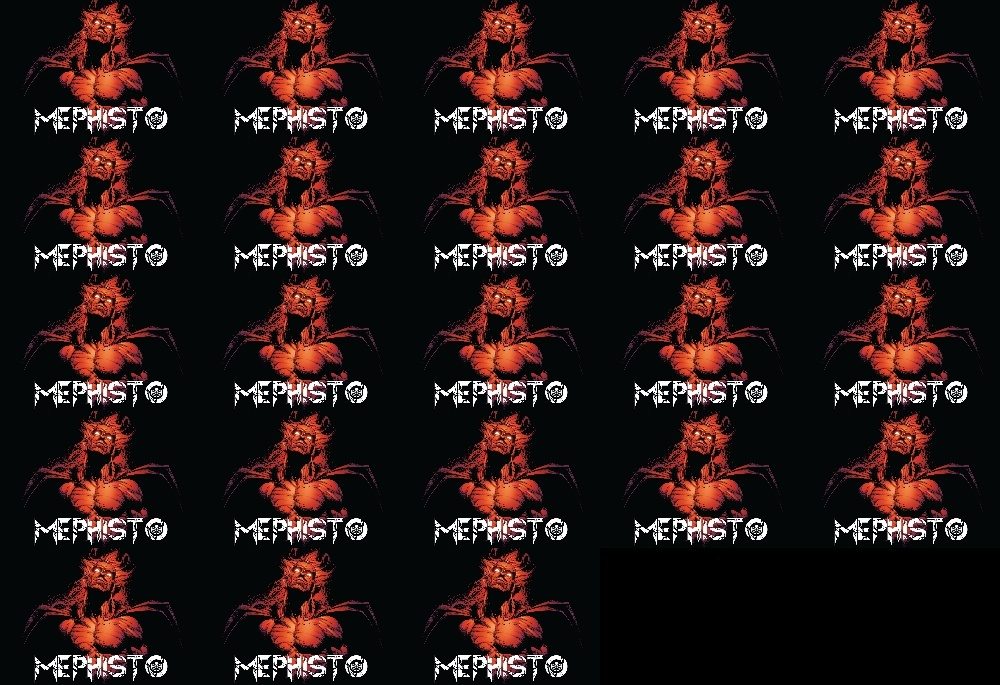
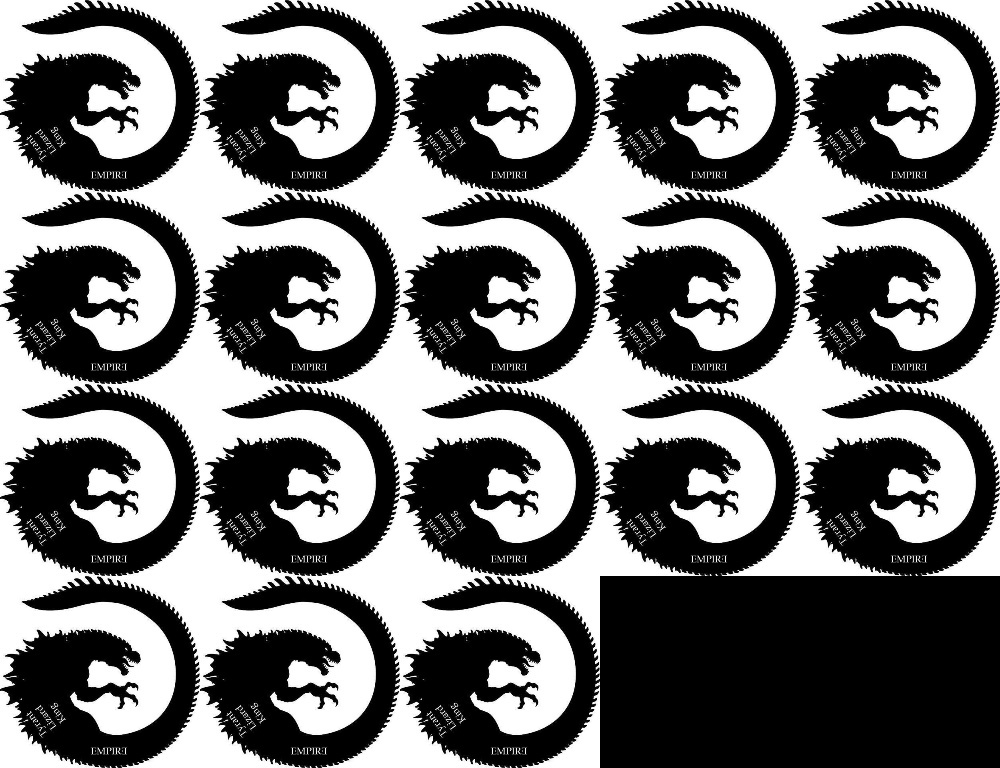
...
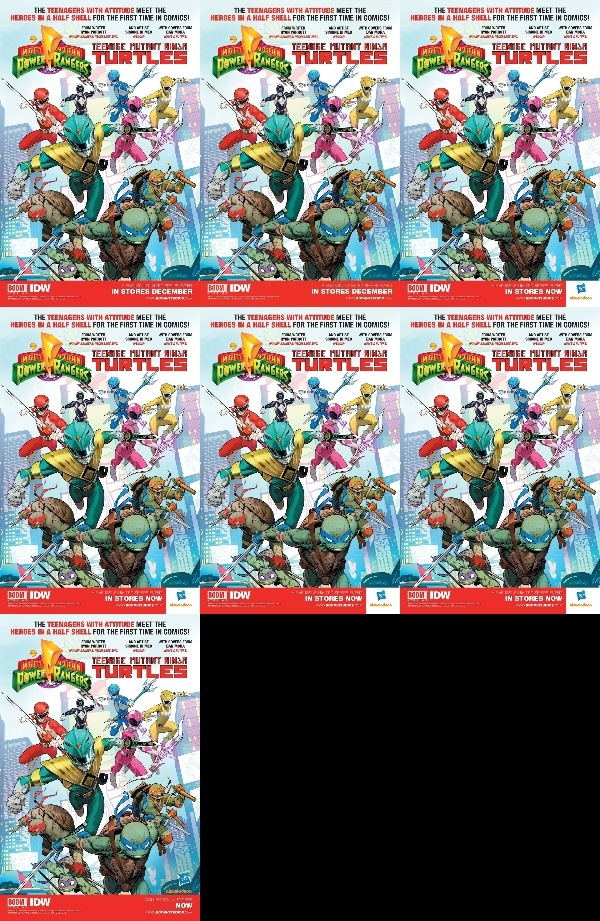
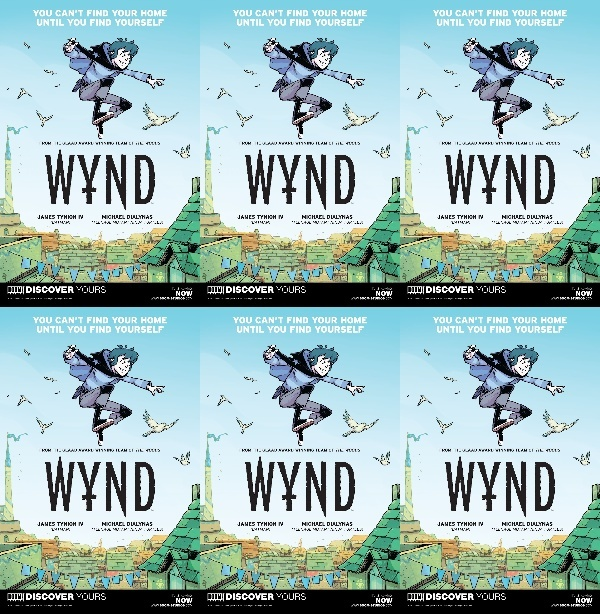
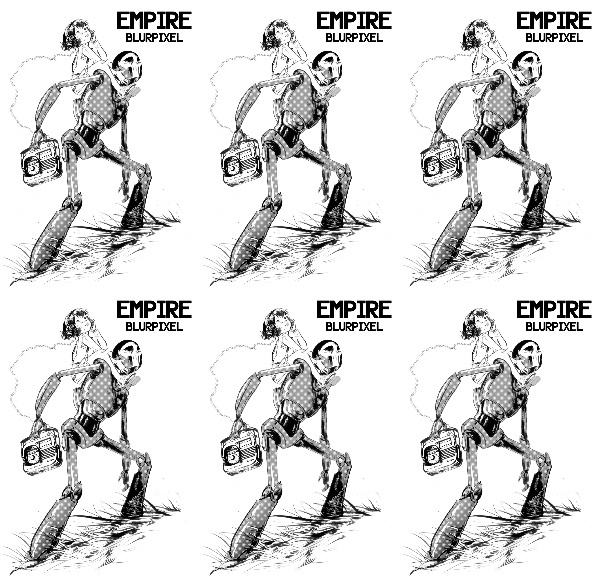
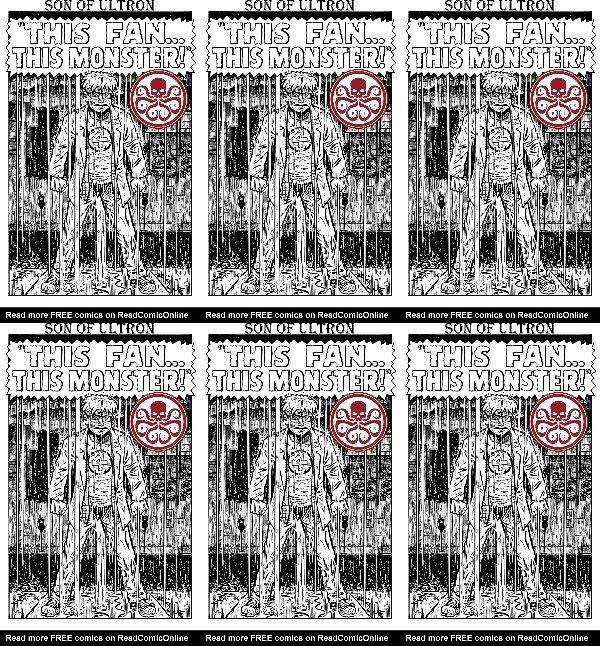

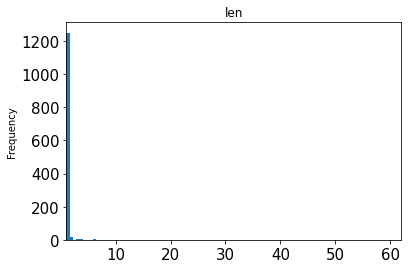

In [27]:
fastdup.create_components_gallery('out2', 'out2', max_width=200, num_images=10)
HTML(filename='out2/components.html')

In [28]:
## Now all 62 images are clustered into the first cluster.

# Solution method 2: Iterative removal of images

In [35]:
#Use the results of the first run, to select redundant images for removal
top_components = fastdup.find_top_components('out')
top_components = top_components[top_components['len'] > 3]
files_to_remove = fastdup.delete_components(top_components, None, 'one', True)

rm -f manga/00006/000068499.jpg
rm -f manga/00006/000068534.jpg
rm -f manga/00006/000068569.jpg
rm -f manga/00006/000068604.jpg
rm -f manga/00006/000068639.jpg
rm -f manga/00006/000068673.jpg
rm -f manga/00006/000068708.jpg
rm -f manga/00006/000068743.jpg
rm -f manga/00006/000068778.jpg
rm -f manga/00006/000068808.jpg
rm -f manga/00006/000068843.jpg
rm -f manga/00006/000068880.jpg
rm -f manga/00006/000068914.jpg
rm -f manga/00006/000068950.jpg
rm -f manga/00006/000068985.jpg
rm -f manga/00006/000069020.jpg
rm -f manga/00006/000069054.jpg
rm -f manga/00006/000069088.jpg
rm -f manga/00006/000069123.jpg
rm -f manga/00006/000069158.jpg
rm -f manga/00006/000069193.jpg
rm -f manga/00006/000069265.jpg
rm -f manga/00006/000069300.jpg
rm -f manga/00006/000069335.jpg
rm -f manga/00006/000069371.jpg
rm -f manga/00006/000069406.jpg
rm -f manga/00006/000069441.jpg
rm -f manga/00006/000069477.jpg
rm -f manga/00006/000069512.jpg
rm -f manga/00006/000069547.jpg
rm -f manga/00006/000069583.jpg
rm -f ma

In [36]:
print('Found in total', len(files_to_remove), 'file to remove')

Found in total 206 file to remove


In [40]:
import pandas as pd
total_files = pd.read_csv('out/atrain_features.dat.csv')['filename'].values
print('Total images in dataset', len(total_files))

Total images in dataset 1523


In [42]:
remaining_images = list(set(total_files)-set(files_to_remove))
print('Running again with remaining images', len(remaining_images))
pd.DataFrame({'filename':remaining_images}).to_csv('remaining.csv')

Running again with remaining images 1317


In [43]:
fastdup.run('remaining.csv', 'out3')

FastDup Software, (C) copyright 2022 Dr. Amir Alush and Dr. Danny Bickson.
On Jupyter notebook running on large datasets, there may be delay getting the console output
A recommended way to fixing this is to run: 
%pip install wurlitzer
%load_ext wurlitzer



0

Failed to read config file ./config.json


100%|██████████| 10/10 [00:01<00:00,  9.86it/s]

Finished OK. Components are stored as image files out3/components_[index].jpg
Stored components visual view in  out3/components.html



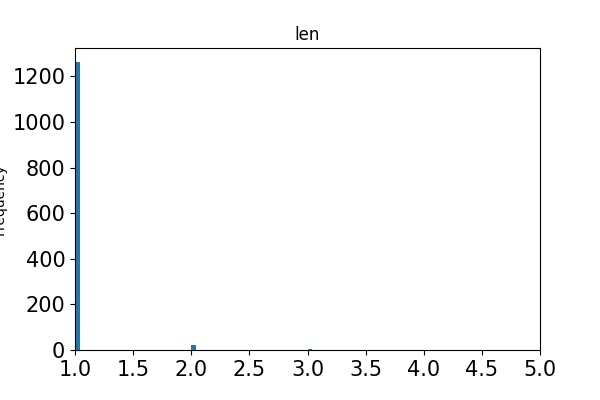
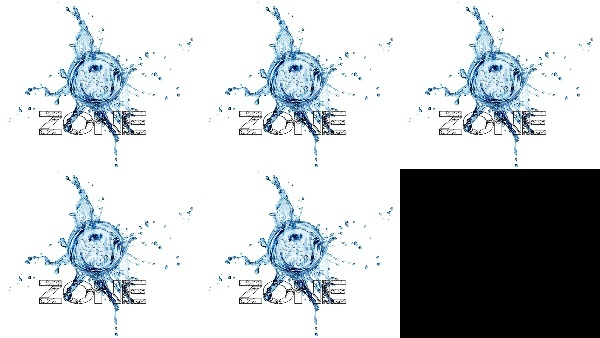
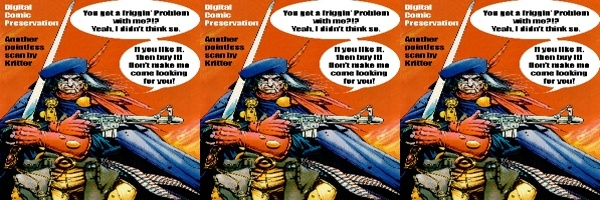
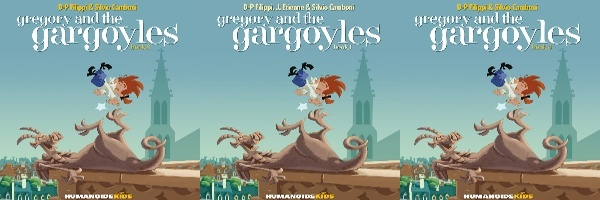
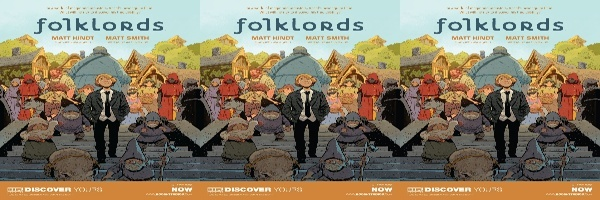
...
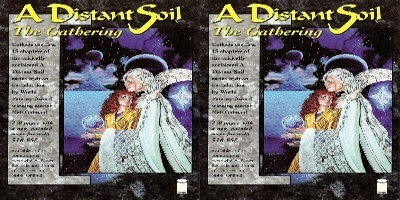
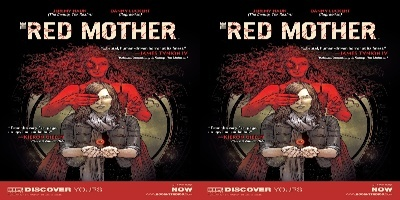
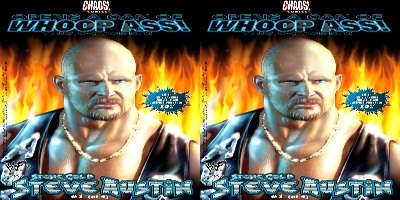
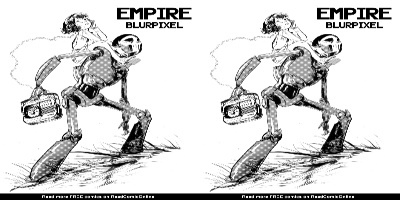

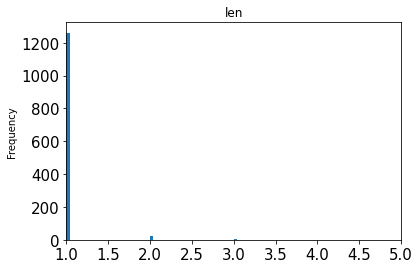

In [45]:
fastdup.create_components_gallery('out3','out3',max_width=200, num_images=10)
HTML('out3/components.html')


In [46]:
## Note that component 563 now contains two images. Each image is a leftover of the original components 44 and 663.


In [57]:
# Find out the contents of compoentns 563
comps = fastdup.find_top_components('out3/')
comps.head()

,component_id,files,distance,len
134,136,"[manga/00007/000077375.jpg, manga/00007/000076748.jpg, manga/00007/000077436.jpg, manga/00007/000077207.jpg, manga/00007/000077467.jpg]",0.998962,5
296,304,"[manga/00007/000075429.jpg, manga/00007/000075400.jpg, manga/00007/000075370.jpg]",1.000000,3
155,159,"[manga/00006/000066786.jpg, manga/00006/000066530.jpg, manga/00006/000066738.jpg]",0.982782,3
182,186,"[manga/00007/000073776.jpg, manga/00007/000073866.jpg, manga/00007/000073835.jpg]",0.999147,3
462,475,"[manga/00006/000065198.jpg, manga/00007/000073870.jpg]",0.999888,2


In [58]:
comps[comps['component_id'] == 563]

,component_id,files,distance,len
549,563,"[manga/00006/000067947.jpg, manga/00006/000068465.jpg]",0.99997,2


In [59]:
## The previous two components where 44 and 663 we can find them the same way
comps[comps['component_id'] == 563]['files']

549    [manga/00006/000067947.jpg, manga/00006/000068465.jpg]
Name: files, dtype: object

In [60]:
comps0 = fastdup.find_top_components('out/')
comps0[comps0['files'].apply(lambda x: 'manga/00006/000067947.jpg' in x or  'manga/00006/000068465.jpg' in x)]

,component_id,files,distance,len
41,44,"[manga/00006/000068465.jpg, manga/00006/000068499.jpg, manga/00006/000068534.jpg, manga/00006/000068569.jpg, manga/00006/000068604.jpg, manga/00006/000068639.jpg, manga/00006/000068673.jpg, manga/00006/000068708.jpg, manga/00006/000068743.jpg, manga/00006/000068778.jpg, manga/00006/000068808.jpg, manga/00006/000068843.jpg, manga/00006/000068880.jpg, manga/00006/000068914.jpg, manga/00006/000068950.jpg, manga/00006/000068985.jpg, manga/00006/000069020.jpg, manga/00006/000069054.jpg, manga/00006/000069088.jpg, manga/00006/000069123.jpg, manga/00006/000069158.jpg, manga/00006/000069193.jpg, manga/00006/000069265.jpg, manga/00006/000069300.jpg, manga/00006/000069335.jpg, manga/00006/000069371.jpg, manga/00006/000069406.jpg, manga/00006/000069441.jpg, manga/00006/000069477.jpg, manga/00006/000069512.jpg, manga/00006/000069547.jpg, manga/00006/000069583.jpg, manga/00006/000069619.jpg, manga/00006/000069655.jpg, manga/00006/000069689.jpg, manga/00006/000069725.jpg, manga/00006/000069761.jpg, manga/00006/000069796.jpg, manga/00006/000069832.jpg, manga/00006/000069904.jpg, manga/00006/000069940.jpg, manga/00006/000069975.jpg, manga/00007/000070011.jpg, manga/00007/000070082.jpg, manga/00007/000070153.jpg, manga/00007/000070189.jpg, manga/00007/000070225.jpg, manga/00007/000070261.jpg]",0.997488,48
570,663,"[manga/00006/000067947.jpg, manga/00006/000067980.jpg, manga/00006/000068014.jpg, manga/00006/000068049.jpg, manga/00006/000068083.jpg, manga/00006/000068117.jpg, manga/00006/000068152.jpg, manga/00006/000068187.jpg, manga/00006/000068256.jpg, manga/00006/000068291.jpg, manga/00006/000068326.jpg, manga/00006/000068361.jpg, manga/00006/000068395.jpg, manga/00006/000068430.jpg]",1.000000,14


## Two summerize the second approach is a two step approach (1) run connected components on the original data. (2) remove duplicates images from the components leacing only a single image for each component and run connected components again on the remaining images. Remaining images that are grouped into a new components mean that the original images from that components are also similar.